### Note
* This notebook assumes that you have executed the other three dataset specific notebooks and directory is setup as per instructions present in them.
* For google street view, please head to the bottom

In [57]:
import argparse
import json
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import subprocess
import warnings

from mim import download
from mmengine.logging import MMLogger
from mmengine.model.utils import revert_sync_batchnorm
from mmseg.apis import init_model, inference_model, show_result_pyplot, MMSegInferencer
from tools.analysis_tools.get_flops import inference, parse_args
from tqdm import tqdm

import torch
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from mmengine.model.utils import revert_sync_batchnorm
from mmseg.apis import init_model, inference_model, show_result_pyplot

# Set warnings to ignore UserWarning otherwise mmseg displays many deprecation warnings
logger = MMLogger.get_instance(name='MMLogger')
logger.setLevel(logging.CRITICAL)
warnings.filterwarnings('ignore', category=UserWarning)

In [2]:
# models is a list of model names, and prints automatically
models = MMSegInferencer.list_models('mmseg')

In [50]:
config_file = '../configs/segformer/segformer_mit-b0_8xb1-160k_cityscapes-1024x1024.py'
checkpoint_file = '../checkpoints/segformer_mit-b0_8x1_1024x1024_160k_cityscapes_20211208_101857-e7f88502.pth'
# build the model from a config file and a checkpoint file
model = init_model(config_file, checkpoint_file)

if not torch.cuda.is_available():
    model = revert_sync_batchnorm(model)

Loads checkpoint by local backend from path: checkpoints/segformer_mit-b0_8x1_1024x1024_160k_cityscapes_20211208_101857-e7f88502.pth


In [64]:
images = [
    'data/cityscapes/leftImg8bit/val/frankfurt/frankfurt_000000_000294_leftImg8bit.png',
    'data/dark_zurich/rgb_anon/val/night/GOPR0356/GOPR0356_frame_000321_rgb_anon.png',
    'data/sydneyscapes/leftImg8bit/val/NSWday/NSWday_000009_345013_leftImg8bit.png',
]
segs = [
    'data/cityscapes/gtFine/val/frankfurt/frankfurt_000000_000294_gtFine_labelTrainIds.png',
    'data/dark_zurich/gt/val/night/GOPR0356/GOPR0356_frame_000321_gt_labelTrainIds.png',
    'data/sydneyscapes/gtFine/val/NSWday/NSWday_000009_345013_gtFine_labelTrainIds.png'
]
save_as = [
    'result/cityscape-segformer-mit0.png',
    'result/darkzurich-segformer-mit0.png',
    'result/sydneyscape-segformer-mit0.png'
]

# Perform segmentation
for i, img in enumerate(images):
    result = inference_model(model, img)
    show_result_pyplot(model, img, result, show=False, out_file=save_as[i])

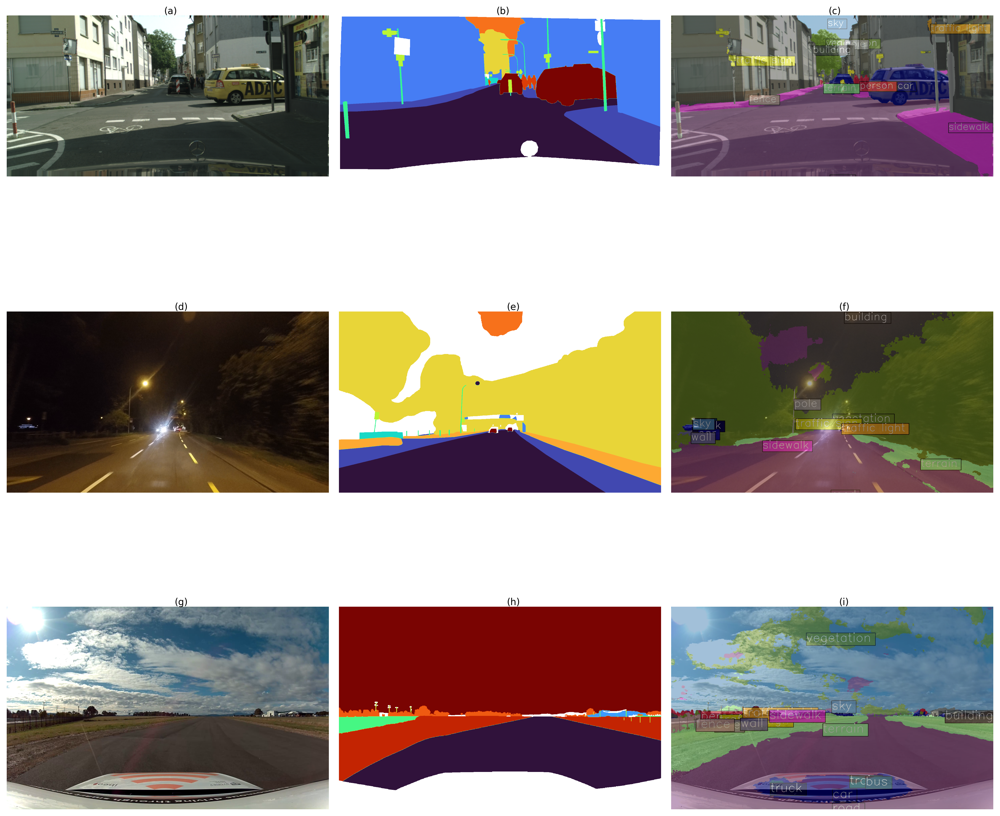

In [68]:
# Remove background pixels from the image
seg_ct = mpimg.imread(segs[0])
seg_ct[seg_ct==1] = np.nan # mask background segments, imread loads values between 0 to 1
seg_dz = mpimg.imread(segs[1])
seg_dz[seg_dz==1] = np.nan # mask background segments, imread loads values between 0 to 1
seg_sc = mpimg.imread(segs[2])
seg_sc[seg_sc==1] = np.nan # mask background segments, imread loads values between 0 to 1

# Create a figure with a grid of subplots
fig, axes = plt.subplots(3, 3, figsize=(15, 15))

# List of images and their labels
images_combined = [
    (images[0], '(a)'), (seg_ct, '(b)'), (save_as[0], '(c)'),
    (images[1], '(d)'), (seg_dz, '(e)'), (save_as[1], '(f)'),
    (images[2], '(g)'), (seg_sc, '(h)'), (save_as[2], '(i)')
]

# Plot each image in the grid
for ax, (image, label) in zip(axes.flat, images_combined):
    if isinstance(image, str):
        image = mpimg.imread(image)
    ax.imshow(image, cmap='turbo')
    ax.axis('off')
    ax.text(1000, -10, label)

plt.tight_layout()
plt.rcParams['figure.dpi'] = 300
plt.axis("off")
plt.savefig('result/qualatative.png')
plt.show()

## Load dataset

1) Download the data by registering on city scape website [here](https://www.cityscapes-dataset.com/downloads/). Store it on the path `mmsegmentation/data/cityscapes/gtFine` and `mmsegmentation/data/cityscapes/leftImg8bit`.
2) Install `cityscapesscripts` library for processing the data into suitable format for use with `mmseg`.

In [3]:
!pip install -q cityscapesscripts

In [6]:
!python ../tools/dataset_converters/cityscapes.py ../data/cityscapes --nproc 8

[>>>>>>>>>>>>>>>>>>>>>>>>>>>] 5000/5000, 622.8 task/s, elapsed: 8s, ETA:     0s


In [44]:
from mmseg.datasets import CityscapesDataset
from mmengine.registry import init_default_scope
init_default_scope('mmseg')

data_root = '../data/cityscapes'
data_prefix=dict(img_path='leftImg8bit/val', seg_map_path='gtFine/val')
test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='RandomCrop', crop_size=(512, 1024), cat_max_ratio=0.75),
    dict(type='RandomFlip', prob=0.5),
    dict(type='PackSegInputs')
]

dataset = CityscapesDataset(data_root=data_root, data_prefix=data_prefix, test_mode=True, pipeline=test_pipeline)

Total images in dataset: 500


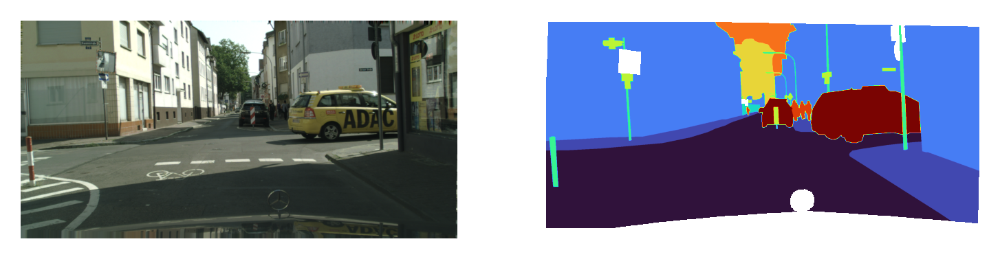

In [75]:
import numpy as np
import matplotlib.image as mpimg

print(f'Total images in dataset: {len(dataset)}')
index = 0
img = mpimg.imread(dataset[index]['data_samples'].img_path)
seg = mpimg.imread(dataset[index]['data_samples'].seg_map_path)
seg[seg==1] = np.nan # mask background segments, imread loads values between 0 to 1

fig, axes = plt.subplots(1, 2)

axes[0].imshow(img)
axes[0].axis('off')
axes[1].imshow(seg, cmap='turbo')
axes[1].axis('off')

plt.show()

In [ ]:
%cd /workspace/mmsegmentation

In [20]:
import subprocess

input_shape = [2048, 1024]
# config_file = '' # Defined earlier

# Convert input_shape to a string format suitable for the command
input_shape_str = ' '.join(map(str, input_shape))

# Construct the command
command = f'python /tools/analysis_tools/get_flops.py {config_file} --shape {input_shape_str}'

# Execute the command
subprocess.run(command, shell=True)

(3, 2048, 1024)
03/26 04:58:06 - mmengine - WARNING - Unsupported operator aten::div encountered 16 time(s)
03/26 04:58:06 - mmengine - WARNING - Unsupported operator aten::mul encountered 40 time(s)
03/26 04:58:06 - mmengine - WARNING - Unsupported operator aten::softmax encountered 8 time(s)
03/26 04:58:06 - mmengine - WARNING - Unsupported operator aten::add encountered 16 time(s)
03/26 04:58:06 - mmengine - WARNING - Unsupported operator aten::gelu encountered 8 time(s)
03/26 04:58:06 - mmengine - WARNING - Unsupported operator aten::feature_dropout encountered 1 time(s)
03/26 04:58:06 - mmengine - WARNING - The following submodules of the model were never called during the trace of the graph. They may be unused, or they were accessed by direct calls to .forward() or via other python methods. In the latter case they will have zeros for statistics, though their statistics will still contribute to their parent calling module.
backbone.layers.0.1.0.attn.attn.out_proj, backbone.layers.

/mmsegmentation/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:250: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(


CompletedProcess(args='python ../tools/analysis_tools/get_flops.py ../configs/segformer/segformer_mit-b0_8xb1-160k_cityscapes-1024x1024.py --shape 2048 1024', returncode=0)

In [4]:
!python tools/test.py \
    configs/segformer/segformer_mit-b0_8xb1-160k_cityscapes-1024x1024.py \
    checkpoints/segformer_mit-b0_8x1_1024x1024_160k_cityscapes_20211208_101857-e7f88502.pth \
    --out result/segformerb0_result

/workspace/mmsegmentation
03/26 08:11:07 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.12 (default, Oct 12 2021, 13:49:34) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 380344699
    GPU 0,1: NVIDIA GeForce RTX 4090
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.3, V11.3.109
    GCC: gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
    PyTorch: 1.11.0
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) oneAPI Math Kernel Library Version 2021.4-Product Build 20210904 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.5.2 (Git Hash a9302535553c73243c632ad3c4c80beec3d19a1e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-ge

In [11]:
!rm -r result/segformerb0_result/.ipynb_checkpoints/

In [12]:
!python tools/analysis_tools/confusion_matrix.py \
    configs/segformer/segformer_mit-b0_8xb1-160k_cityscapes-1024x1024.py \
    result/segformerb0_result \
    result/confusion_matrix --show

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 500/500, 20.0 task/s, elapsed: 25s, ETA:     0stools/analysis_tools/confusion_matrix.py:100: RuntimeWarning: invalid value encountered in true_divide
  confusion_matrix.astype(np.float32) / per_label_sums * 100
Figure(11400x9120)


In [14]:
!python tools/analysis_tools/benchmark.py \
    configs/segformer/segformer_mit-b0_8xb1-160k_cityscapes-1024x1024.py \
    checkpoints/segformer_mit-b0_8x1_1024x1024_160k_cityscapes_20211208_101857-e7f88502.pth \
    --log-interval 50 \
    --work-dir result/benchmark \
    --repeat-times 1

Run 1:
/mmsegmentation/mmseg/models/builder.py:36: UserWarning: ``build_loss`` would be deprecated soon, please use ``mmseg.registry.MODELS.build()`` 
  warnings.warn('``build_loss`` would be deprecated soon, please use '
/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:250: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  warnings.warn(
Loads checkpoint by local backend from path: checkpoints/segformer_mit-b0_8x1_1024x1024_160k_cityscapes_20211208_101857-e7f88502.pth
Done image [50 / 200], fps: 22.51 img / s
Done image [100/ 200], fps: 22.52 img / s
Done image [150/ 200], fps: 22.53 img / s
Done image [200/ 200], fps: 22.53 img / s
Overall fps: 22.53 img / s

Average fps of 1 evaluations: 22.53
The variance of 1 evaluations: 0.0


## Exploring the dataset

In [24]:
import os
import shutil
from mmseg.evaluation.metrics import CityscapesMetric

run_dir = '../evaluation'
run_index = '1'
run_path = os.path.join(run_dir, run_index)

if os.path.exists(run_path):
    shutil.rmtree(run_path)
os.makedirs(run_path)

metric = CityscapesMetric(output_dir=run_path, ignore_index=255, format_only=False, keep_results=True, collect_device='cpu', prefix=None)

03/26 05:12:55 - mmengine - WARNING - The prefix is not set in metric class CityscapesMetric.


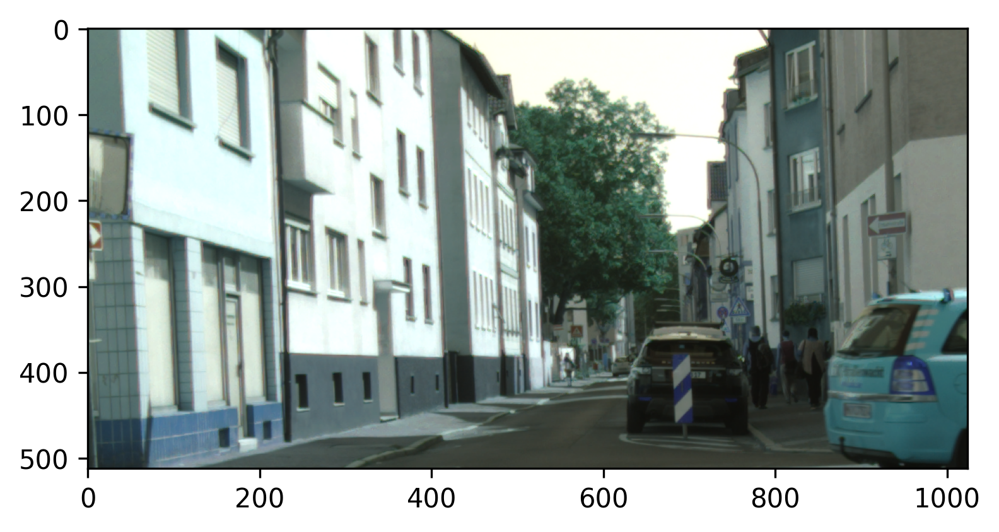

In [93]:
row = dataset[0]
img = np.array(row['inputs'])
img = np.transpose(img, (1, 2, 0))
plt.imshow(img, cmap='turbo')

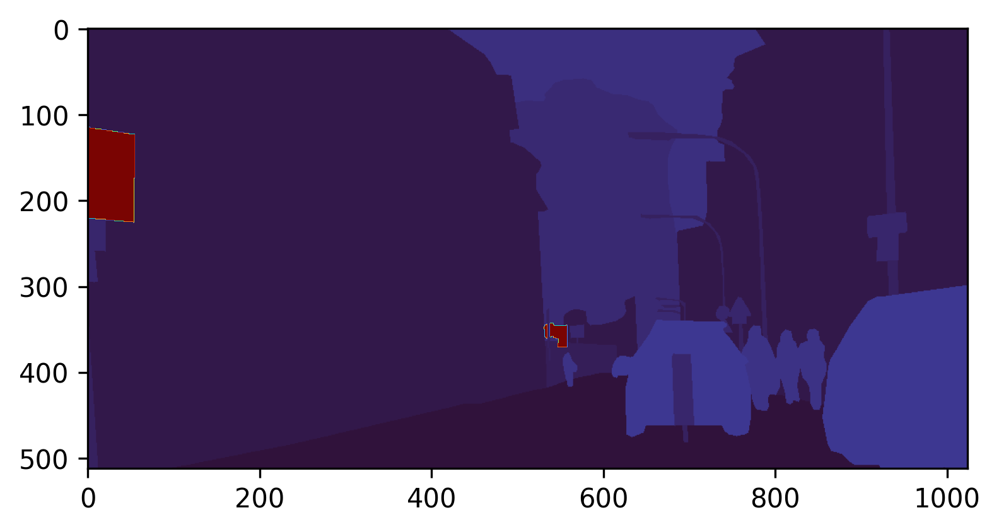

In [95]:
seg = np.array(row['data_samples'].gt_sem_seg.data.squeeze(0))
seg[seg==1] = 0 # mask background segments, imread loads values between 0 to 1
plt.imshow(seg, cmap='turbo')

In [26]:
for row in len(dataset):
    row = dataset[0]
    img = np.array(row['inputs'])
    img = mpimg.imread(row['data_samples'].img_path)
    seg = mpimg.imread(row['data_samples'].seg_map_path)
    seg[seg==1] = np.nan # mask background segments, imread loads values between 0 to 1
    

Help on method compute_metrics in module mmseg.evaluation.metrics.citys_metric:

compute_metrics(results: list) -> Dict[str, float] method of mmseg.evaluation.metrics.citys_metric.CityscapesMetric instance
    Compute the metrics from processed results.
    
    Args:
        results (list): Testing results of the dataset.
    
    Returns:
        dict[str: float]: Cityscapes evaluation results.



In [ ]:
python tools/test.py ${CONFIG_FILE} ${CHECKPOINT_FILE} [optional arguments]
This tool accepts several optional arguments, including:

--work-dir: If specified, results will be saved in this directory. If not specified, the results will be automatically saved to work_dirs/{CONFIG_NAME}.
--show: Show prediction results at runtime, available when --show-dir is not specified.
--show-dir: Directory where painted images will be saved. If specified, the visualized segmentation mask will be saved to the work_dir/timestamp/show_dir.
--wait-time: The interval of show (s), which takes effect when --show is activated. Default to 2.
--cfg-options: If specified, the key-value pair in xxx=yyy format will be merged into the config file.
--tta: Test time augmentation option.

# Construct the command
command = f'python ../tools/test.py {config_file} {checkpoint_file}'

# Execute the command
subprocess.run(command, shell=True)

## Benchmark